In [1]:
import pandas as pd
from bifacial_peak_shaving import *
from utils import *
pd.options.plotting.backend='plotly'

# Data

In [2]:
dir = './Data/'

## Load

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 8760 entries, 1901-01-01 00:00:00 to 1901-12-31 23:00:00
Freq: H
Data columns (total 1 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Load (kW)  8760 non-null   float64
dtypes: float64(1)
memory usage: 136.9 KB
None


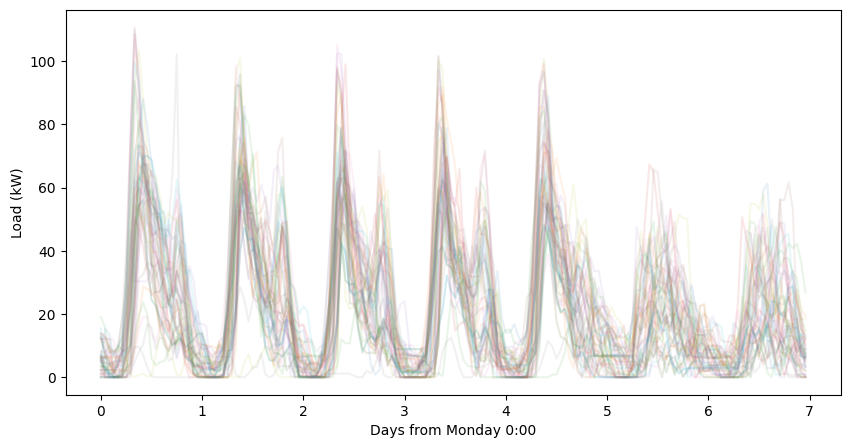

In [3]:
load = pd.read_csv(dir+'acn_caltech_profile_1y.csv',
                   #index_col=0,
                   #parse_dates=True,
                   comment='#',
                   usecols=[2],
                   )
                    #.resample('1h').mean()
                    #.fillna(method='ffill')
                    #.loc['2018-4-26':'2019-3-22']
#load = pd.DataFrame({'Load (kW)':list(load.loc['2019-1-2 0:00':'2019-1-2 16:00','Load (kW)'])+list(load.loc[:,'Load (kW)'])},
#                     index=pd.date_range('2019-1-1 0:00',periods=8760,freq='1h'))
#load.loc['2019-5-20'] = load.loc['2019-5-22'].values
#load.loc['2019-5-21'] = load.loc['2019-5-22'].values
load.index = pd.date_range('1901-1-1 0:00',periods=35040,freq='15min')
load = load.resample('1h').mean()
print(load.info())
plot_weekly(load['Load (kW)'])

In [4]:
load['Load (kW)'].plot()

## Solar

- 7 kWp, TMY

- Net zero capacity

  - $capacity[kWp] = production[kWh] \times yield [\frac{kWh}{kWp}]^{-1}$

In [5]:
solar_angles = ['s20','w20','w90','s20w90']
solar = pd.concat(( 
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_7kwp_s20deg.csv',index_col=0),
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_7kwp_w20deg.csv',index_col=0),
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_7kwp_w90deg.csv',index_col=0),
                    pd.read_csv(dir+'Solar/Modelled/lemooreCA_3.5kwp_s20deg_3.5kwp_w90deg.csv',index_col=0),
                   ),
                  axis=1)
solar.index = pd.date_range('1900-1-1 0:00',periods=8760,freq='1h')
solar.columns = solar_angles
net_zero_capacity = load['Load (kW)'].sum() / (solar.s20.sum()/7) # load=production / yield
solar = solar * net_zero_capacity/7 # scale to net 0
#solar = solar * 2 # randomly scale up
solar.describe()

,s20,w20,w90,s20w90
count,8760.000000,8760.000000,8760.000000,8760.000000
mean,19.913887,17.801734,19.045143,19.495684
std,28.116124,25.125326,25.036433,24.828871
min,-0.069281,-0.069281,-0.063140,-0.057946
25%,-0.008196,-0.008196,-0.008196,-0.008196
50%,-0.008196,-0.008196,-0.008196,-0.008196
75%,39.375306,34.899477,36.681002,42.021706
max,113.619475,109.463243,95.927687,88.275993


In [6]:
solar.loc['1900-8-25':'1900-8-27'].plot()

In [7]:
# for col in solar:
#     plot_daily(solar[col],title=col,interval_min=60)

## Plot weekly

In [8]:
solar.index = load.index
df = pd.concat((load,solar),axis=1)
df.columns = ['load'] + ['solar_'+x for x in solar.columns]
for angle in solar.columns:
    df[f'netload_{angle}'] = df['load'] - solar[angle]
df    

,load,solar_s20,solar_w20,solar_w90,solar_s20w90,netload_s20,netload_w20,netload_w90,netload_s20w90
1901-01-01 00:00:00,6.234351,-0.008196,-0.008196,-0.008196,-0.008196,6.242546,6.242546,6.242546,6.242546
1901-01-01 01:00:00,6.234351,-0.008196,-0.008196,-0.008196,-0.008196,6.242546,6.242546,6.242546,6.242546
1901-01-01 02:00:00,5.507010,-0.008196,-0.008196,-0.008196,-0.008196,5.515206,5.515206,5.515206,5.515206
1901-01-01 03:00:00,0.000000,-0.008196,-0.008196,-0.008196,-0.008196,0.008196,0.008196,0.008196,0.008196
1901-01-01 04:00:00,0.000000,-0.008196,-0.008196,-0.008196,-0.008196,0.008196,0.008196,0.008196,0.008196
...,...,...,...,...,...,...,...,...,...
1901-12-31 19:00:00,15.207377,-0.008196,-0.008196,-0.008196,-0.008196,15.215573,15.215573,15.215573,15.215573
1901-12-31 20:00:00,24.791792,-0.008196,-0.008196,-0.008196,-0.008196,24.799988,24.799988,24.799988,24.799988
1901-12-31 21:00:00,19.189889,-0.008196,-0.008196,-0.008196,-0.008196,19.198085,19.198085,19.198085,19.198085
1901-12-31 22:00:00,6.357917,-0.008196,-0.008196,-0.008196,-0.008196,6.366113,6.366113,6.366113,6.366113


load v s20

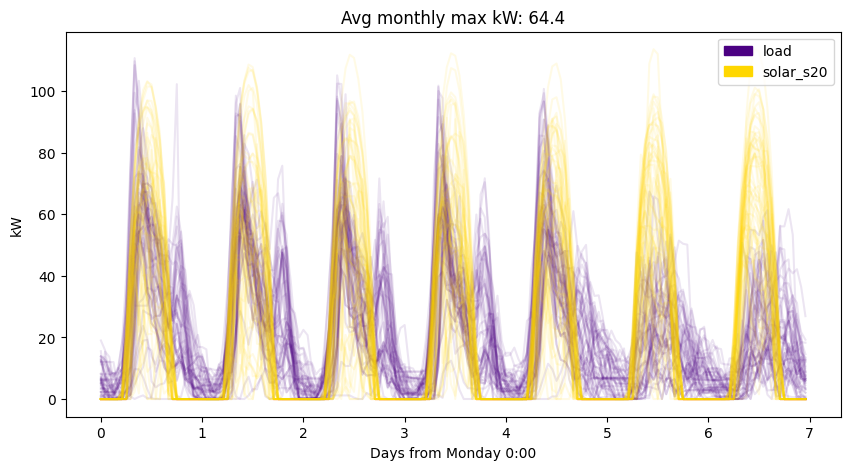

In [9]:
l = df['load']
s = df['solar_s20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

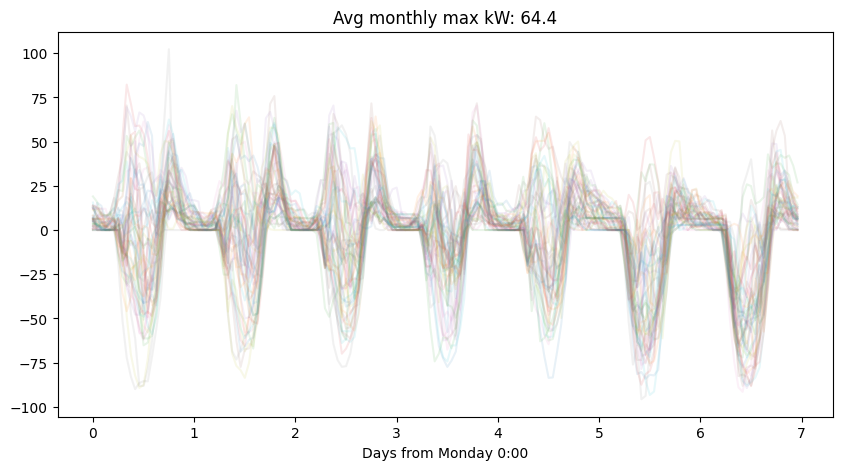

In [10]:
l = df['load']
s = df['solar_s20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v w20

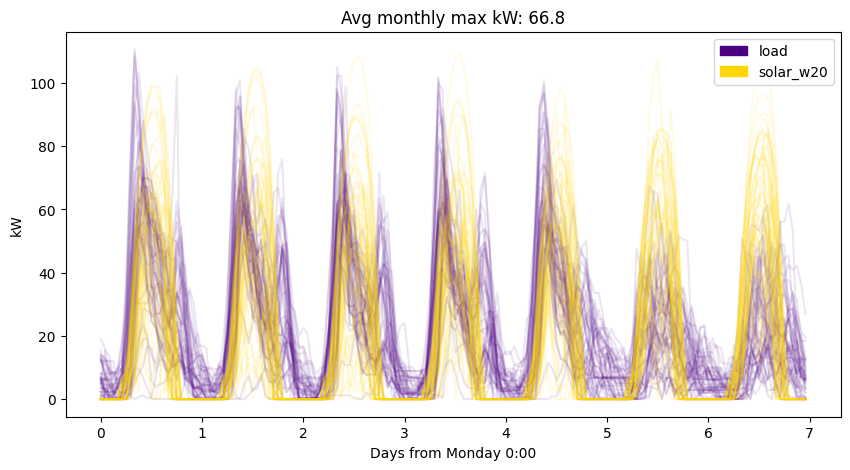

In [11]:
l = df['load']
s = df['solar_w20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

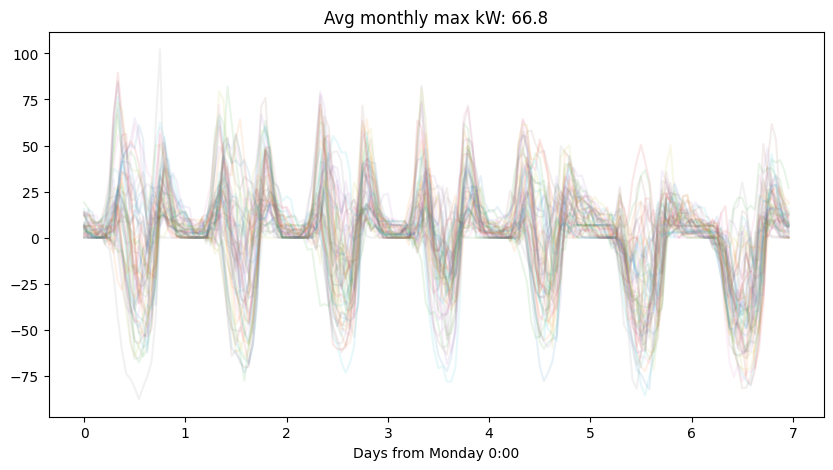

In [12]:
l = df['load']
s = df['solar_w20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v w90

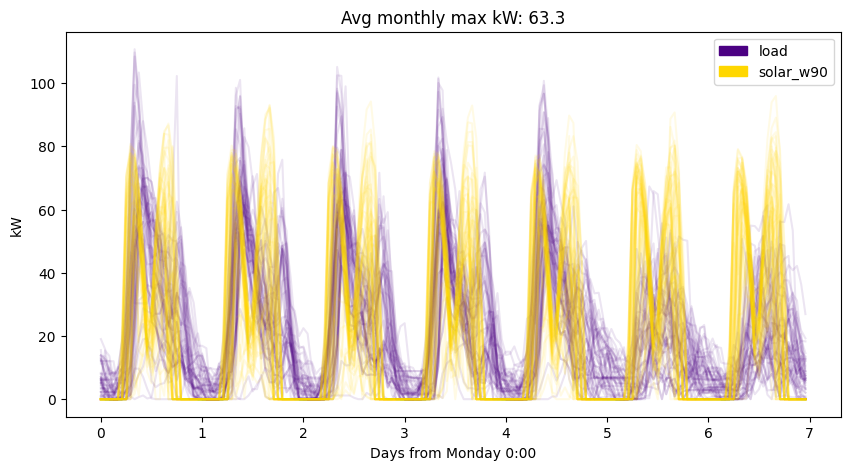

In [13]:
l = df['load']
s = df['solar_w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

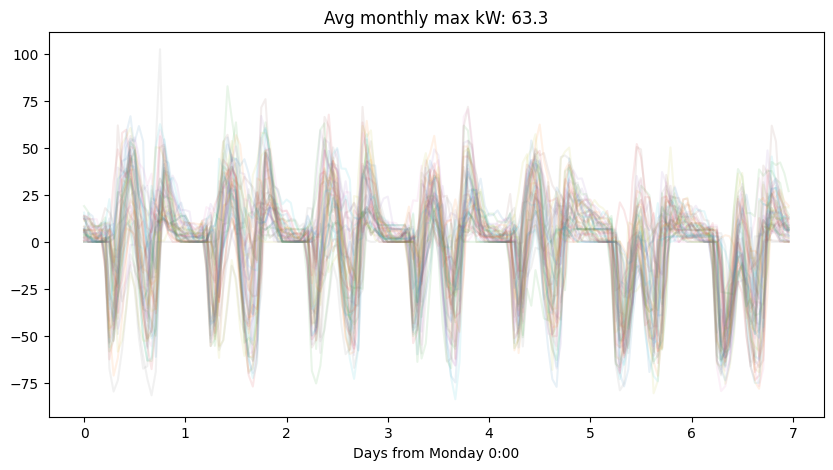

In [14]:
l = df['load']
s = df['solar_w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v s20w90

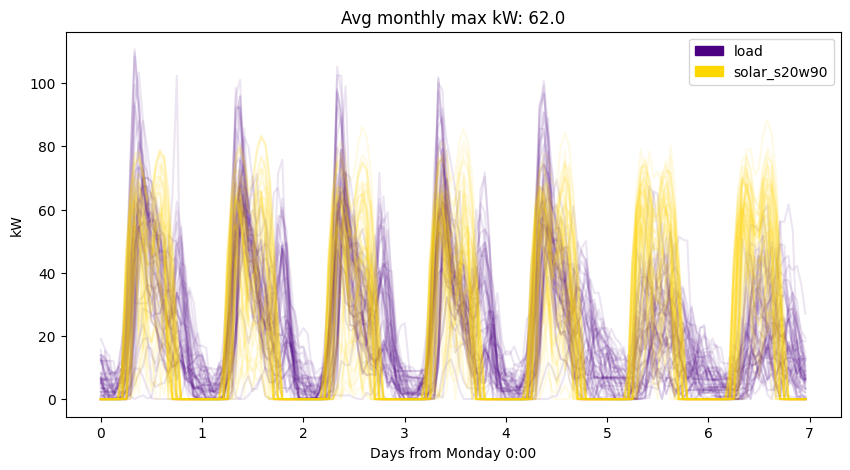

In [15]:
l = df['load']
s = df['solar_s20w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

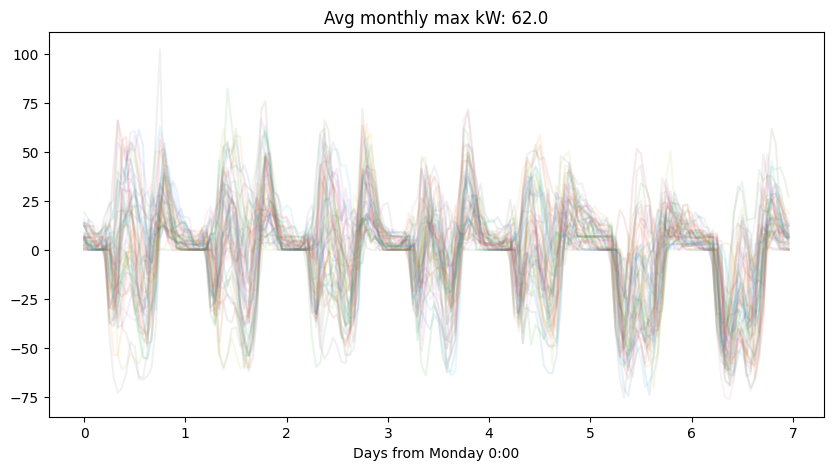

In [16]:
l = df['load']
s = df['solar_s20w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

# Monthly peaks

## Single TOU

In [17]:
peak_begin,peak_end = 8,11
angle = 's20'
peaks = calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)

angle = 'w20'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

angle = 'w90'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

angle = 's20w90'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

print('Avg w20 reduction',peaks['netload_s20->w20 reduc kw'].mean())
print('Avg w90 reduction',peaks['netload_s20->w90 reduc kw'].mean())
print('Avg s20w90 reduction',peaks['netload_s20->s20w90 reduc kw'].mean())
peaks

Avg w20 reduction -3.433333333333334
Avg w90 reduction 4.175000000000001
Avg s20w90 reduction 3.6166666666666676


,netload_s20 kw,netload_s20 t,netload_w20 kw,netload_w20 t,netload_s20->w20 reduc kw,netload_w90 kw,netload_w90 t,netload_s20->w90 reduc kw,netload_s20w90 kw,netload_s20w90 t,netload_s20->s20w90 reduc kw
1,82.0,1901-01-22 10:00:00,82.0,1901-01-22 10:00:00,0.0,82.6,1901-01-22 10:00:00,-0.6,82.3,1901-01-22 10:00:00,-0.3
2,54.0,1901-02-06 09:00:00,54.0,1901-02-06 09:00:00,0.0,54.5,1901-02-06 09:00:00,-0.5,54.2,1901-02-06 09:00:00,-0.2
3,36.2,1901-03-14 09:00:00,48.1,1901-03-14 09:00:00,-11.9,29.8,1901-03-27 09:00:00,6.4,31.7,1901-03-14 09:00:00,4.5
4,58.4,1901-04-17 08:00:00,58.4,1901-04-17 08:00:00,0.0,59.2,1901-04-17 08:00:00,-0.8,58.8,1901-04-17 08:00:00,-0.4
5,43.5,1901-05-17 09:00:00,43.7,1901-05-17 09:00:00,-0.2,46.5,1901-05-17 09:00:00,-3.0,45.0,1901-05-17 09:00:00,-1.5
6,38.0,1901-06-14 10:00:00,39.8,1901-06-28 08:00:00,-1.8,43.4,1901-06-28 10:00:00,-5.4,38.7,1901-06-28 10:00:00,-0.7
7,64.1,1901-07-05 09:00:00,58.2,1901-07-05 10:00:00,5.9,47.1,1901-07-23 09:00:00,17.0,50.3,1901-07-05 10:00:00,13.8
8,82.3,1901-08-26 08:00:00,89.6,1901-08-26 08:00:00,-7.3,62.9,1901-08-21 09:00:00,19.4,65.6,1901-08-26 08:00:00,16.7
9,70.4,1901-09-09 08:00:00,85.0,1901-09-09 08:00:00,-14.6,61.8,1901-09-09 08:00:00,8.6,66.1,1901-09-09 08:00:00,4.3
10,70.1,1901-10-01 09:00:00,81.4,1901-10-03 08:00:00,-11.3,57.6,1901-10-14 10:00:00,12.5,61.8,1901-10-01 09:00:00,8.3


## Variable TOU

w20

In [18]:
angle1 = 's20'
angle2 = 'w20'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>0.2]

,TOU begin [h],TOU end [h],max peak reduction [kW],avg peak reduction [kW],min peak reduction [kW]
20,9,19,12.9,1.1,-11.9
23,10,12,15.4,3.4,-0.2
24,10,13,10.4,1.8,-0.2
25,10,14,10.4,1.4,-0.6
26,10,15,10.4,1.4,-0.6
27,10,16,10.4,1.4,-0.6
28,10,17,10.4,1.4,-0.6
29,10,18,7.3,1.1,-0.6
30,10,19,12.9,2.0,-0.6
33,11,13,10.2,1.6,-1.0


w90

In [19]:
angle1 = 's20'
angle2 = 'w90'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>0.2]

,TOU begin [h],TOU end [h],max peak reduction [kW],avg peak reduction [kW],min peak reduction [kW]
0,8,10,19.4,5.4,-3.0
1,8,11,19.4,4.2,-5.4
2,8,12,19.4,1.8,-11.1
3,8,13,18.8,1.3,-11.1
4,8,14,18.8,1.3,-11.1
5,8,15,18.8,1.3,-11.1
6,8,16,18.8,1.3,-11.1
7,8,17,18.8,1.3,-11.1
8,8,18,18.8,1.3,-11.1
9,8,19,18.8,1.9,-7.1


s20w90

In [20]:
angle1 = 's20'
angle2 = 's20w90'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>0.2]

,TOU begin [h],TOU end [h],max peak reduction [kW],avg peak reduction [kW],min peak reduction [kW]
0,8,10,16.7,4.2,-1.5
1,8,11,16.7,3.6,-1.5
2,8,12,16.7,3.2,-4.8
3,8,13,16.7,2.6,-4.8
4,8,14,16.7,2.6,-4.8
5,8,15,16.7,2.6,-4.8
6,8,16,16.7,2.6,-4.8
7,8,17,16.7,2.6,-4.8
8,8,18,16.7,2.6,-4.8
9,8,19,16.7,3.9,-0.8


Best for w90

In [21]:
#df.loc['2022-6-28':'2022-6-30'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

In [22]:
#df.loc['2022-3-5':'2022-3-7'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

Largest spread w90 v s20w90

In [23]:
#df.loc['2022-10-12':'2022-10-14'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

# Peak shaving

## Technical

More or less technical peak shaving doesn't benefit from bifacial, I think because if you're trying to shave the entire day you benefit more from the greater kWh produced by s20 than any of the other angles.

### Single angle

In [24]:
angle = 's20'
threshold = 100
batt_kwh_max = 50
tou_h = list(range(24))

batt_kwh,dispatch = find_smallest_soe0(df,f'netload_{angle}',threshold,batt_kwh_max,tou_h,)

plotly_stacked(dispatch,
               solar=f'solar_{angle}',
               title=f'Treshold kW = {threshold}, TOU = {tou_h[0]}-{tou_h[-1]}, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

Solution found: netload_s20, Threshold kw = 100.0, Battery kWh = 3.0,


### Several angles

In [25]:
threshold = 100
batt_kwh_max = 100
TOU_hours = list(range(24))

results = pd.DataFrame([],columns=['batt_kwh','dispatch'],index=solar_angles)
for angle in solar_angles:
    df2 = df.copy(deep=True)
    batt_kwh,dispatch = find_smallest_soe0(df,
                                            f'netload_{angle}',
                                            threshold,
                                            batt_kwh_max,
                                            TOU_hours)
    results.loc[angle,:] = [batt_kwh,dispatch]
results

Solution found: netload_s20, Threshold kw = 100.0, Battery kWh = 3.0,
Solution found: netload_w20, Threshold kw = 100.0, Battery kWh = 3.0,
Solution found: netload_w90, Threshold kw = 100.0, Battery kWh = 3.0,
Solution found: netload_s20w90, Threshold kw = 100.0, Battery kWh = 3.0,


,batt_kwh,dispatch
s20,3,load solar_s20 sol...
w20,3,load solar_s20 sol...
w90,3,load solar_s20 sol...
s20w90,3,load solar_s20 sol...


s20

In [26]:
angle = 's20'

batt_kwh = results.batt_kwh[angle]
dispatch = results.dispatch[angle]
plotly_stacked(dispatch,#.loc['2022-8-25':'2022-8-27'],
               solar='solar_'+angle,
               title=f'Threshold kW = {threshold}, Peak TOU = {TOU_hours[0]}:00-{1+TOU_hours[-1]}:00, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

w90

In [27]:
angle = 'w90'

batt_kwh = results.batt_kwh[angle]
dispatch = results.dispatch[angle]
plotly_stacked(dispatch,#.loc['2022-8-25':'2022-8-27'],
               solar='solar_'+angle,
               title=f'Threshold kW = {threshold}, Peak TOU = {TOU_hours[0]}:00-{1+TOU_hours[-1]}:00, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

## Economic

### Single angle

In [28]:
threshold = 0
batt_kwh_max = 5000
angle = 's20'
tou_h = list(range(16,21))

batt_kwh,dispatch = find_smallest_soe0(df,f'netload_{angle}',threshold,batt_kwh_max,tou_h,)

plotly_stacked(dispatch,
               solar=f'solar_{angle}',
               title=f'Treshold kW = {threshold}, TOU = {TOU_hours[0]}-{TOU_hours[-1]}, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

Failed on first battery size, try 1.1x
Failed on first battery size, try 2x
Solution found: netload_s20, Threshold kw = 0.0, Battery kWh = 9910.0,


### Several angles

In [29]:
threshold = 0
batt_kwh_max = 10000
TOU_hours = list(range(16,21))

results = pd.DataFrame([],columns=['batt_kwh','dispatch'],index=solar_angles)
for angle in solar_angles:
    df2 = df.copy(deep=True)
    batt_kwh,dispatch = find_smallest_soe0(df,
                                            f'netload_{angle}',
                                            threshold,
                                            batt_kwh_max,
                                            TOU_hours)
    results.loc[angle,:] = [batt_kwh,dispatch]
results

Solution found: netload_s20, Threshold kw = 0.0, Battery kWh = 9910.0,
Solution found: netload_w20, Threshold kw = 0.0, Battery kWh = 7641.0,
Solution found: netload_w90, Threshold kw = 0.0, Battery kWh = 3281.0,
Solution found: netload_s20w90, Threshold kw = 0.0, Battery kWh = 6189.0,


,batt_kwh,dispatch
s20,9910,load solar_s20 sol...
w20,7641,load solar_s20 sol...
w90,3281,load solar_s20 sol...
s20w90,6189,load solar_s20 sol...


s20

In [30]:
angle = 's20'

batt_kwh = results.batt_kwh[angle]
dispatch = results.dispatch[angle]
plotly_stacked(dispatch,#.loc['2022-8-25':'2022-8-27'],
               solar='solar_'+angle,
               title=f'Threshold kW = {threshold}, Peak TOU = {TOU_hours[0]}:00-{1+TOU_hours[-1]}:00, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')

w90

In [31]:
angle = 'w90'

batt_kwh = results.batt_kwh[angle]
dispatch = results.dispatch[angle]
plotly_stacked(dispatch,#.loc['2022-8-25':'2022-8-27'],
               solar='solar_'+angle,
               title=f'Threshold kW = {threshold}, Peak TOU = {TOU_hours[0]}:00-{1+TOU_hours[-1]}:00, '+\
                     f'Solar = {angle} <br>Battery kWh = {batt_kwh:.1f}')